# Notebook 02: Exploratory Data Analysis

This notebook explores the data cleaned in [Notebook 1: Data Cleaning](01_data_cleaning.ipynb).

In [1]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import datetime
import warnings
import seaborn as sns

# custom function imports
from custom_functions import *
from regression_custom_functions import *
from eda_custom_functions import *

In [2]:
df_models = pd.read_csv('../data/cleaned_datasets/df_models.csv')

## Value counts per category

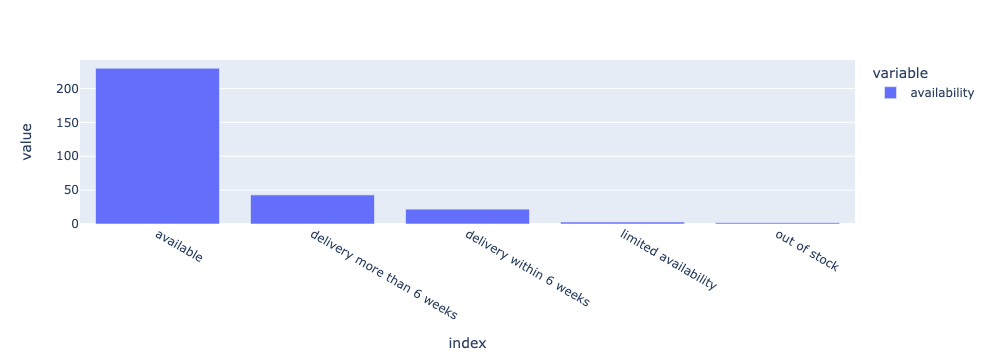

In [3]:
px.bar(df_models['availability'].value_counts())

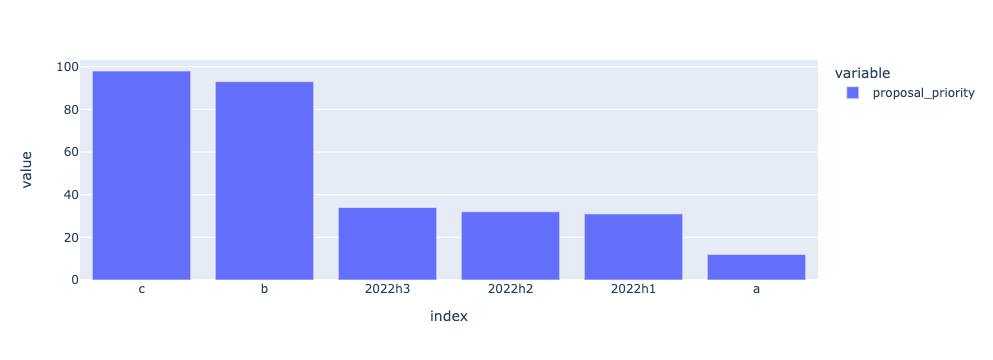

In [4]:
# few are "A" priority, but together with the 2022 new models, they are about the same as the "B" and "C" category
px.bar(df_models['proposal_priority'].value_counts())

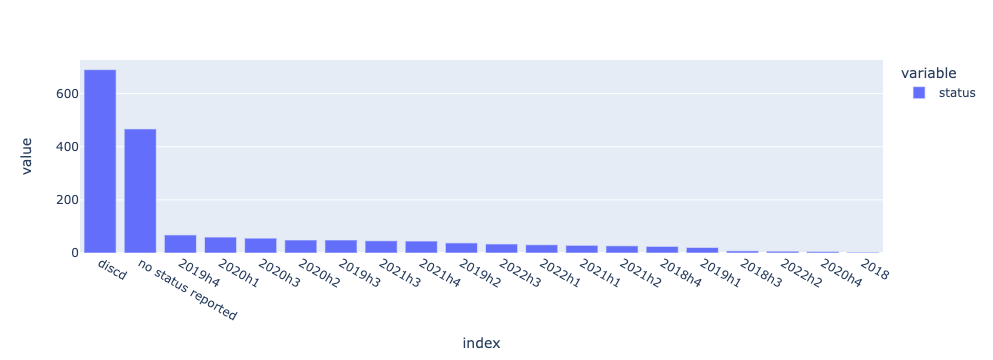

In [5]:
px.bar(df_models['status'].value_counts())

Most watches are discontinued or do not have a reported status. Each quarter usually has 25-50 models released.

## Analyze sales data

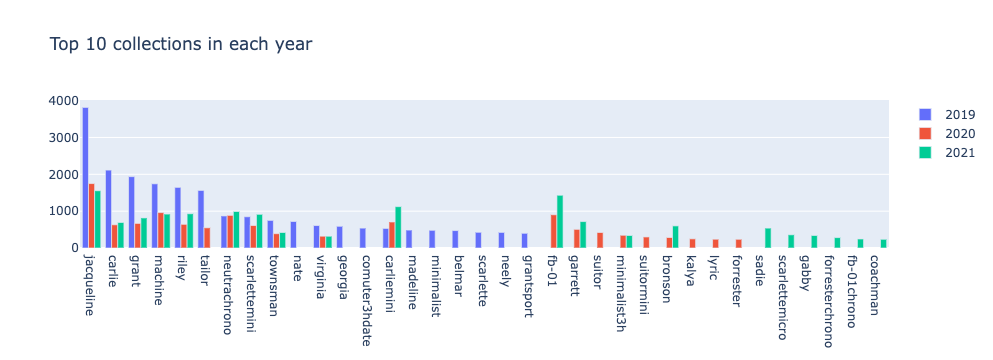

In [6]:
sales = return_date_col(df_models.groupby('collection').sum())

sales_style = return_sales(df_models, 'style_id')

sales_collection = return_sales(df_models, 'collection')

top_collections_2019 = dict(sales_collection.loc['2019',:].sum().sort_values(ascending=False).head(20))
top_collections_2020 = dict(sales_collection.loc['2020',:].sum().sort_values(ascending=False).head(20))
top_collections_2021 = dict(sales_collection.loc['2021',:].sum().sort_values(ascending=False).head(20))

fig = go.Figure(data=[
    go.Bar(name='2019', x=list(top_collections_2019.keys()), y=list(top_collections_2019.values())),
    go.Bar(name='2020', x=list(top_collections_2020.keys()), y=list(top_collections_2020.values())),
    go.Bar(name='2021', x=list(top_collections_2021.keys()), y=list(top_collections_2021.values()))
])
# Change the bar mode
fig.update_layout(barmode='group', title=f'Top 10 collections in each year')
fig.show()

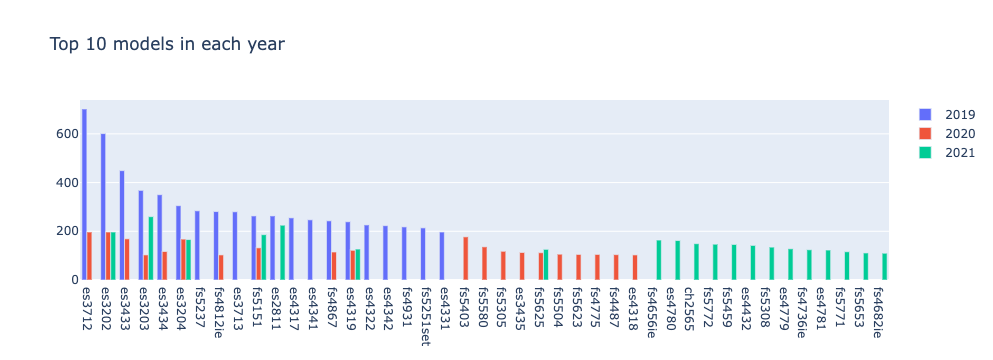

In [7]:
top_collections_2019 = dict(sales_style.loc['2019',:].sum().sort_values(ascending=False).head(20))
top_collections_2020 = dict(sales_style.loc['2020',:].sum().sort_values(ascending=False).head(20))
top_collections_2021 = dict(sales_style.loc['2021',:].sum().sort_values(ascending=False).head(20))

fig = go.Figure(data=[
    go.Bar(name='2019', x=list(top_collections_2019.keys()), y=list(top_collections_2019.values())),
    go.Bar(name='2020', x=list(top_collections_2020.keys()), y=list(top_collections_2020.values())),
    go.Bar(name='2021', x=list(top_collections_2021.keys()), y=list(top_collections_2021.values()))
])
# Change the bar mode
fig.update_layout(barmode='group', title=f'Top 10 models in each year')
fig.show()

It seems that watch sales for the best selling models were much greater in 2019 than in 2021 or 2022. Some watches gained in popularity however. Let's explore this decrease in sales further.

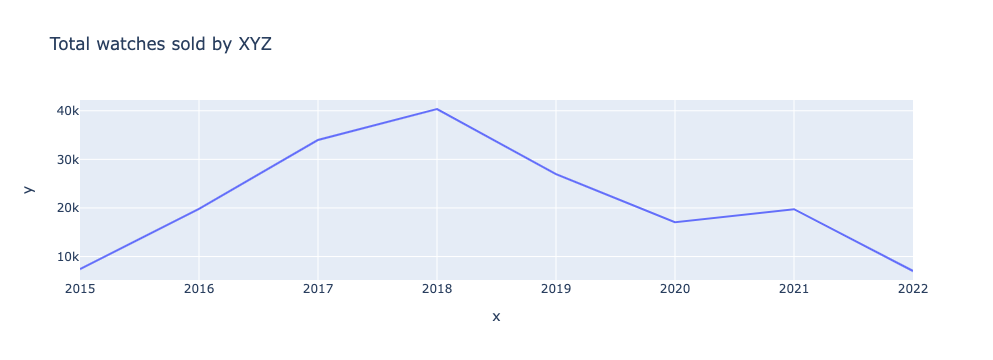

In [8]:
years = ['2015', '2016', '2017', '2018', '2019', '2020',
       '2021','2022']
px.line(x=years, y = [monthly_to_yearly(df_models.groupby(by = 'collection').sum(),year).sum() for year in years],
       title="Total watches sold by XYZ")

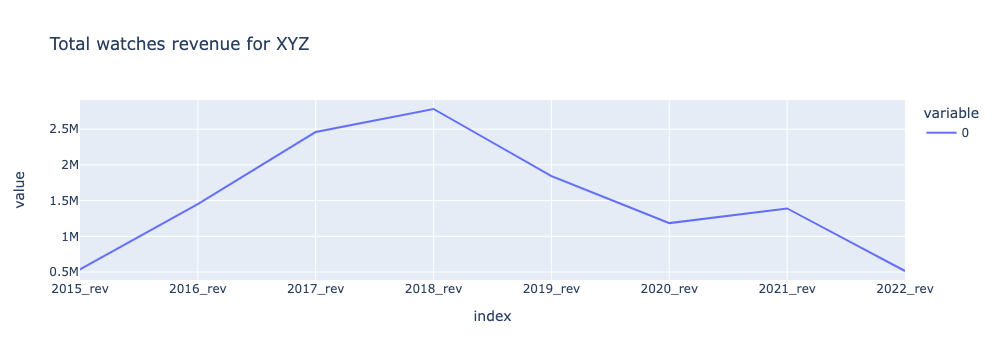

In [9]:
# Let's explore revenue to see if it followed the same general trend as overall sales

for index in df_models.index:
    for year in years:
        df_models.loc[index,f'{year}_rev'] = (monthly_to_yearly(df_models,year)[index]*df_models.loc[index,'wholesale_price'])

px.line(df_models.groupby(by = 'collection').sum().sum()[['2015_rev', '2016_rev', '2017_rev', '2018_rev',
       '2019_rev', '2020_rev', '2021_rev', '2022_rev']],title="Total watches revenue for XYZ")

Watch revenue also apperas to follow the same trend, which seems to indicate that the decrease the sales is not offset by higher margin products.

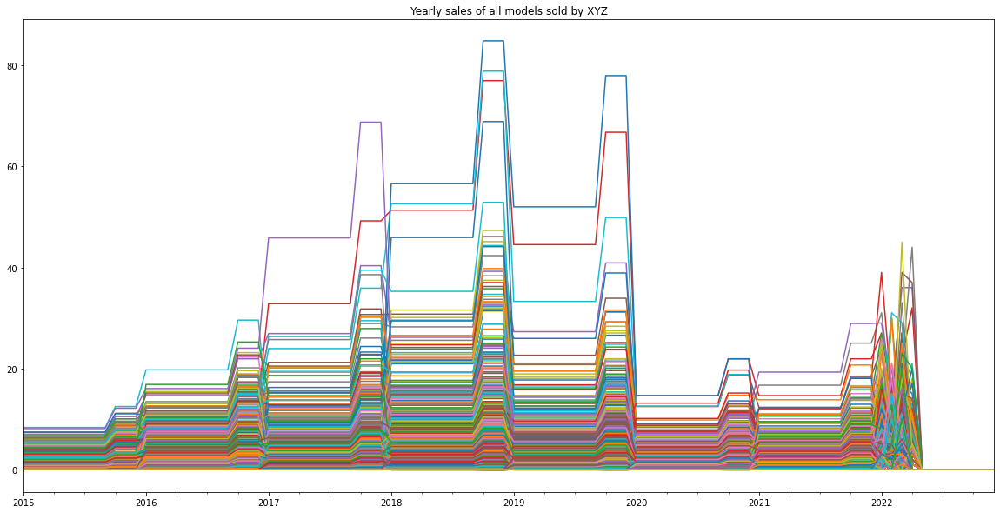

In [10]:
sales_style.plot(figsize = (20,10),legend=False,title='Yearly sales of all models sold by XYZ');

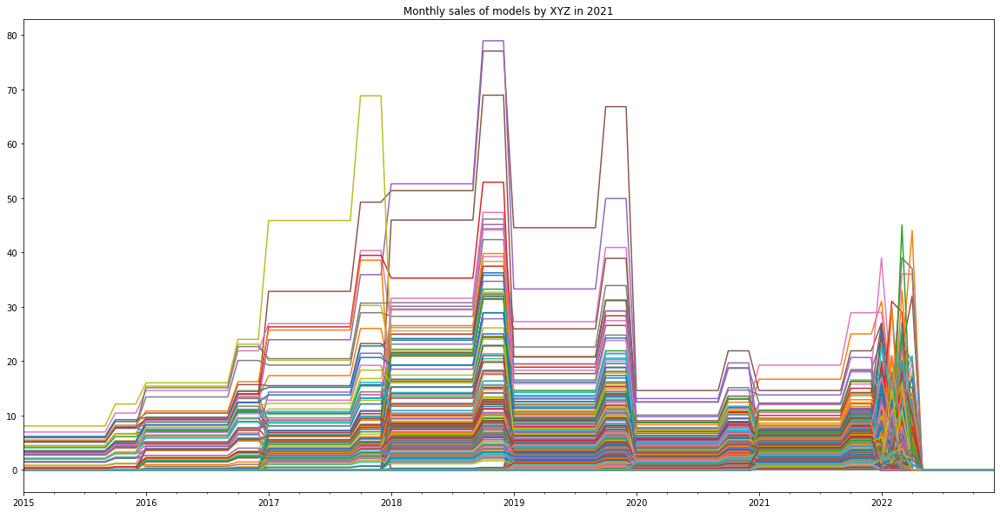

In [11]:
sales_style[list(sales_style.columns[sales_style.loc['2021',:].sum() > 0])].plot(figsize = (20,10),legend=False,title='Monthly sales of models by XYZ in 2021');

It seems that most models that sold in 2021 sold less than 20 models per month in 2021. There are some exceptions, which are the bestsellers

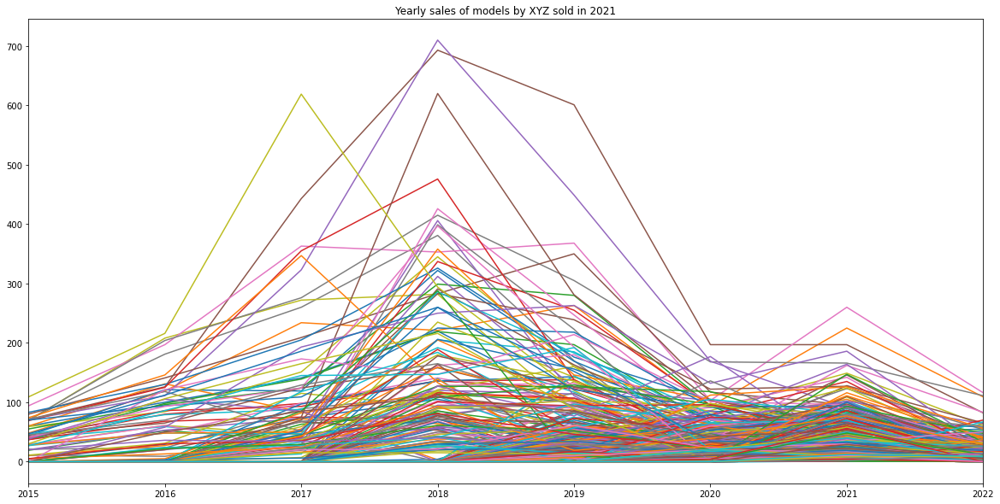

In [12]:
sales_style_yearly = sales_style.resample('Y').sum()

models_sold_2021 = []
for c in sales_style_yearly:
    if sales_style_yearly.loc['2021',c].values > 0:
        models_sold_2021.append(c)
        
sales_style_yearly[models_sold_2021].plot(figsize = (20,10),legend=False,title='Yearly sales of models by XYZ sold in 2021');

It seems that most models that sold in 2021 sold less than 100 models. There are some exceptions, which are the bestsellers

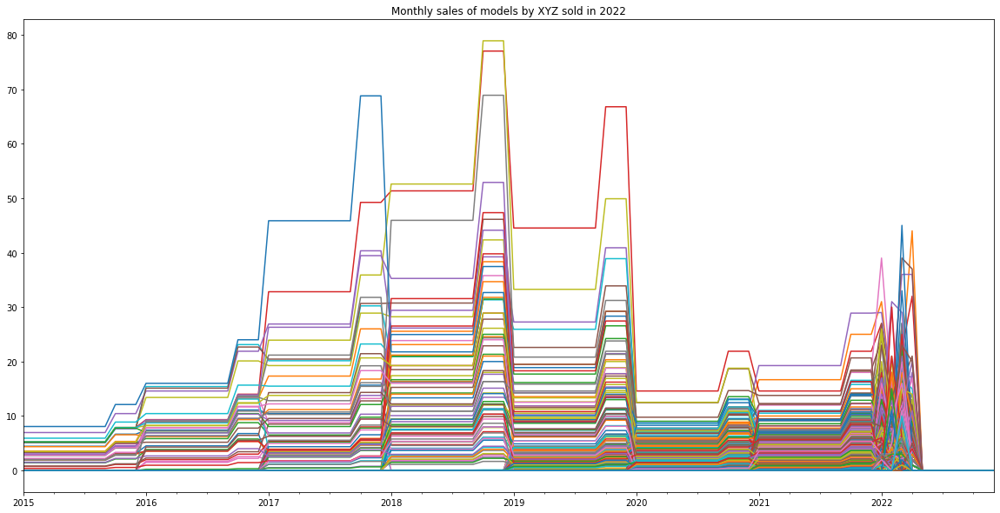

In [13]:
sales_style[list(sales_style.columns[sales_style.loc['2022',:].sum() > 0])].plot(figsize = (20,10),legend=False,title='Monthly sales of models by XYZ sold in 2022');

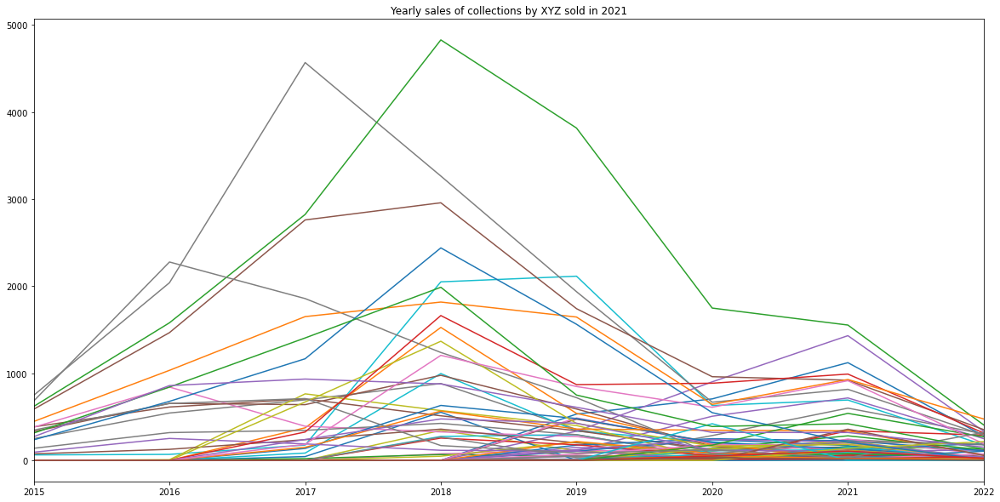

In [14]:
sales_collection_yearly = sales_collection.resample('Y').sum()

collections_sold_2021 = []
for c in sales_collection_yearly:
    if sales_collection_yearly.loc['2021',c].values > 0:
        collections_sold_2021.append(c)
        
sales_collection_yearly[collections_sold_2021].plot(figsize = (20,10),legend=False,title='Yearly sales of collections by XYZ sold in 2021');

Some collections are more successful than others, but the disparity has changed since 2018/2019

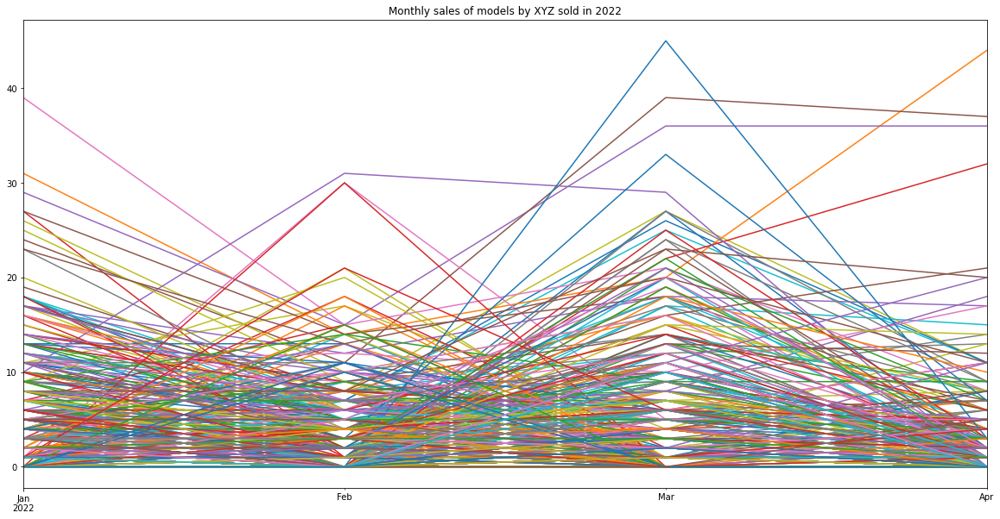

In [15]:
# This is the same graph as above but focused in 2022
sales_style[list(sales_style.columns[sales_style.loc['2022',:].sum() > 0])].loc['2022-01':'2022-04',:].plot(figsize = (20,10),legend=False,title='Monthly sales of models by XYZ sold in 2022');

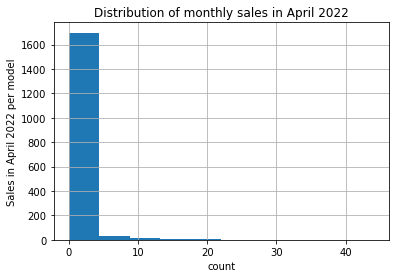

In [16]:
sales_style.loc['2022-04',:].T.hist()
plt.title('Distribution of monthly sales in April 2022')
plt.xlabel('count')
plt.ylabel('Sales in April 2022 per model');

Most watches sold less than 5 units in April 2022 - Based on April's data, it seems that "good" watch sales are somewhere between 10-20 units sold/month

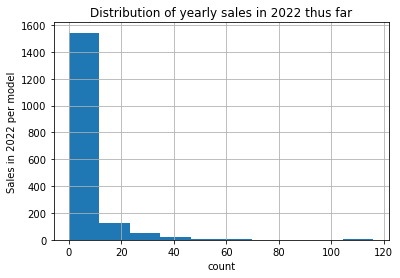

In [17]:
sales_style.loc['2022',:].sum().T.hist()
plt.title('Distribution of yearly sales in 2022 thus far')
plt.xlabel('count')
plt.ylabel('Sales in 2022 per model');

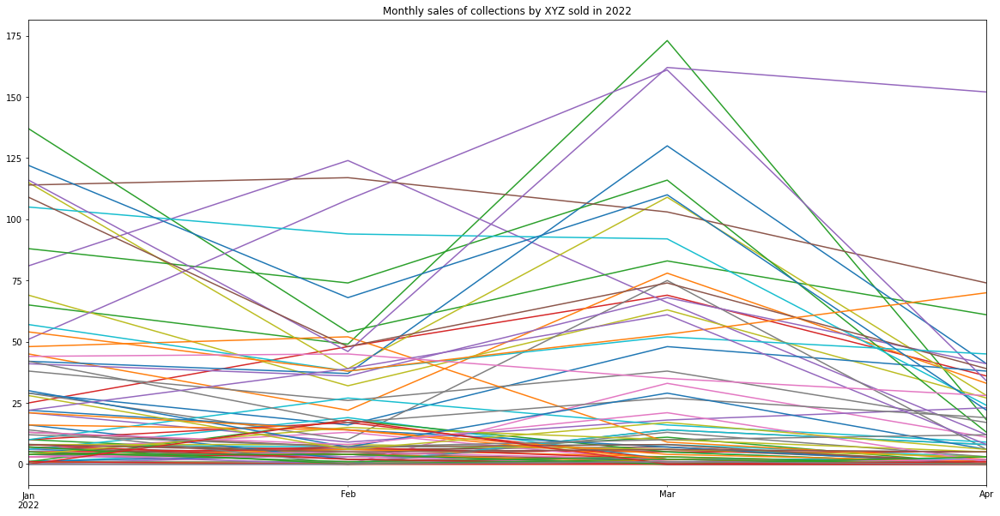

In [18]:
sales_collection[list(sales_collection.columns[sales_collection.loc['2022',:].sum() > 0])].loc['2022-01':'2022-04',:].plot(figsize = (20,10),legend=False,title='Monthly sales of collections by XYZ sold in 2022');

## Analysis of model features vs normalized sales

Calculate and compare features that will go into the model against normalized yearly sales (target for classification & regression models in notebooks 5 and 6)

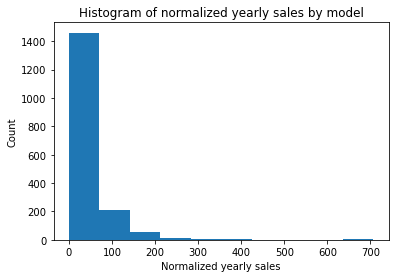

In [19]:
df_models = calc_norm_yearly_sales(df_models, 4, 2019)

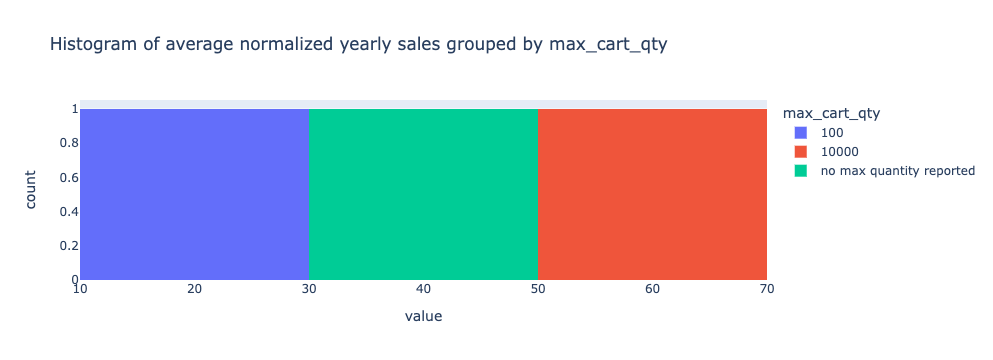

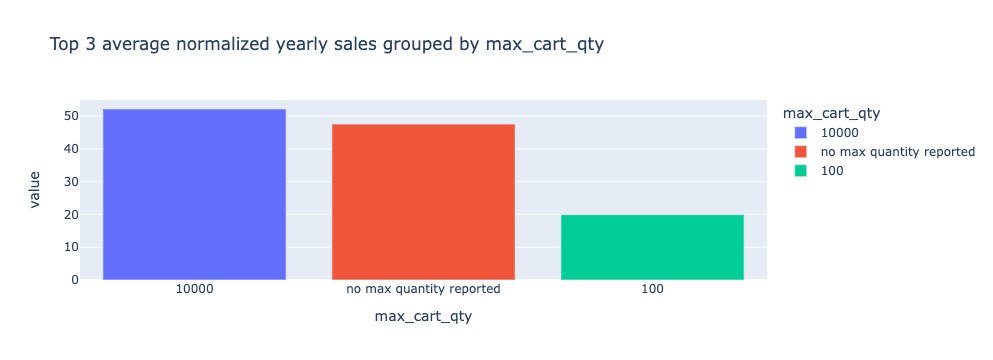

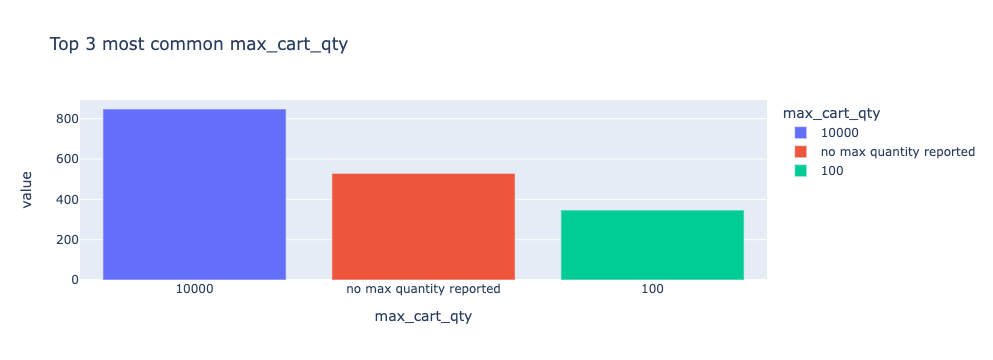

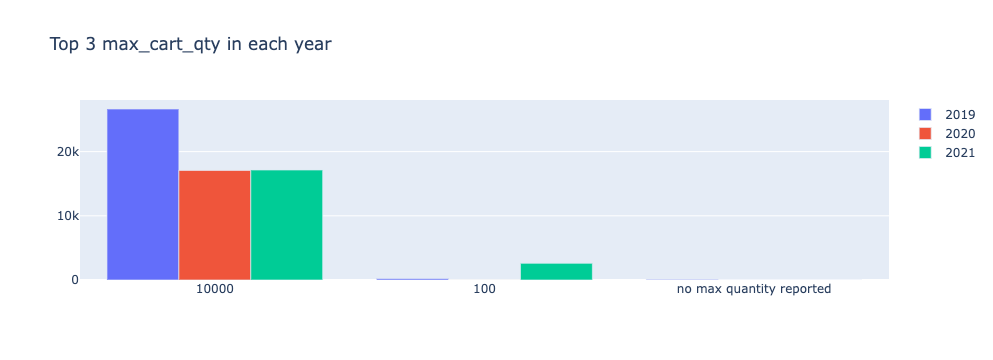

In [20]:
eda_by_column(df_models,'max_cart_qty')

max_cart_qty seems to have some impact on the normalized sales. Among the new models, it is about a 50-50 split, so it could downweight many of the new models. I may want to consider dropping this term, since it could be related to supply issues (not necessarily special, desirable models). However, the new models do not have this variable reported. 

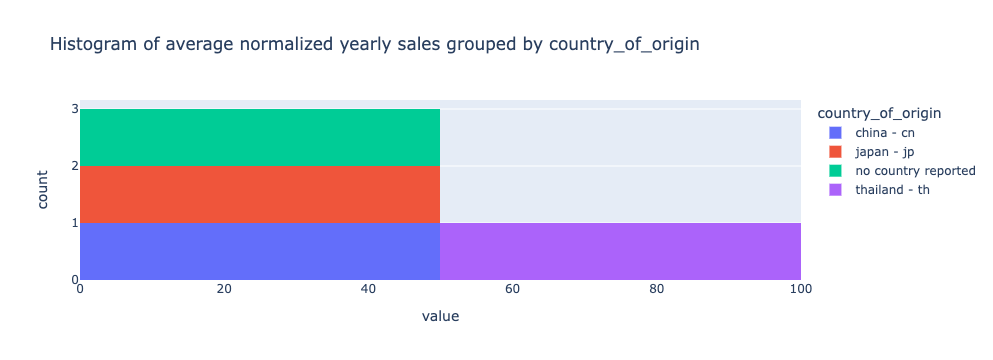

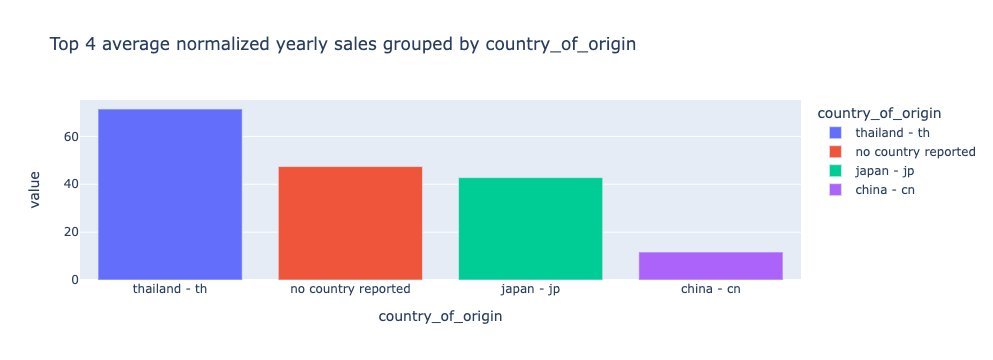

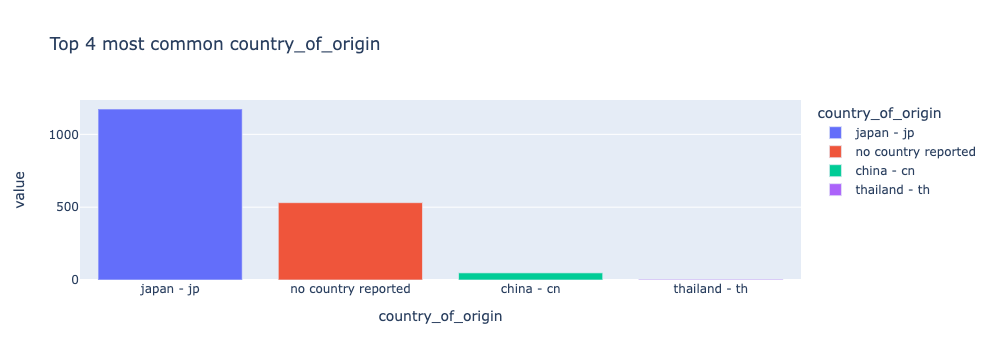

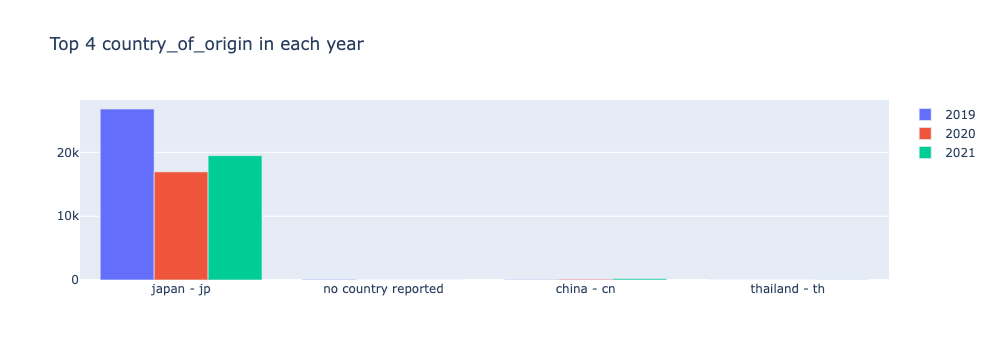

In [21]:
eda_by_column(df_models,'country_of_origin')

Most models are manufactured in japan, but the minorities manufactured in china & thailand have large differences in sales. This is a useful column, especially because the there is distribution in the proposal. Unfortunately, all models in new dataset were manufactured in japan (or not reported in two instances)so this won't impact our results currently.

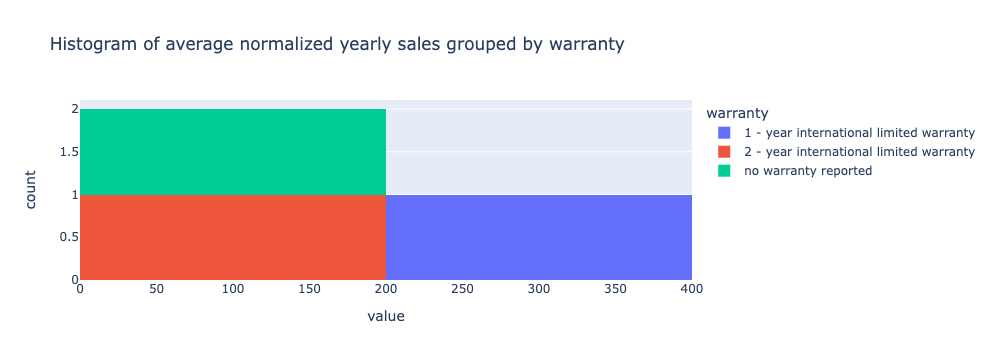

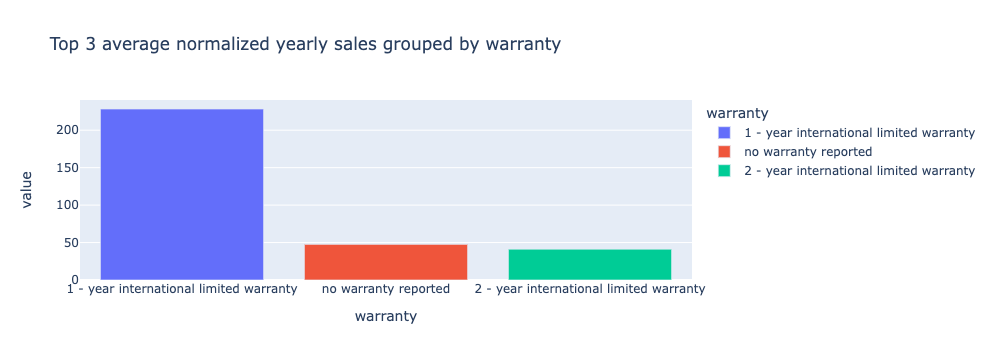

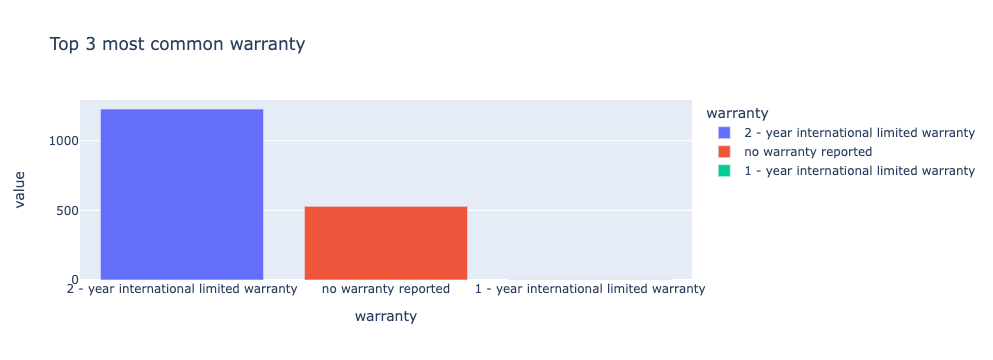

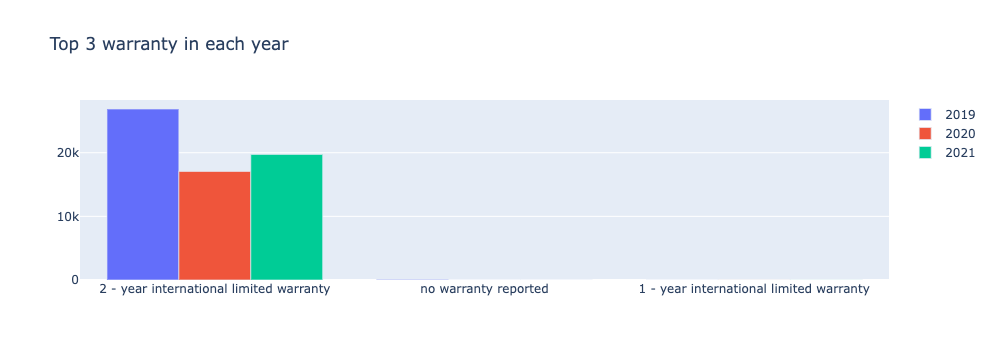

In [22]:
eda_by_column(df_models,'warranty')

While warranty has a large impact, none of the new models have a 1 year warranty, so this won't impact our results currently.

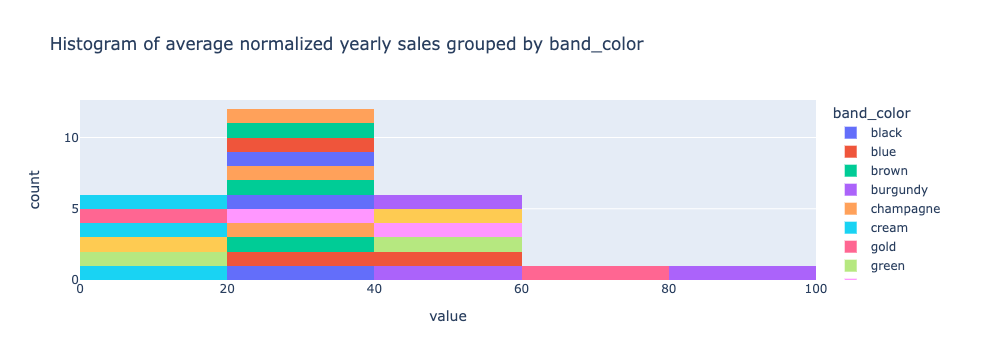

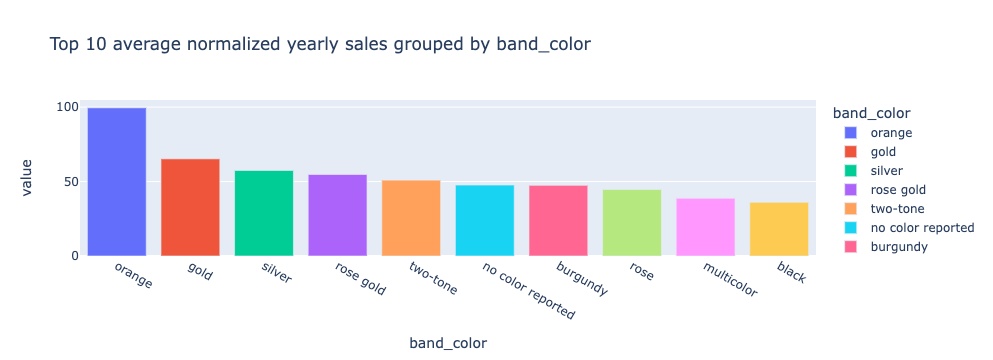

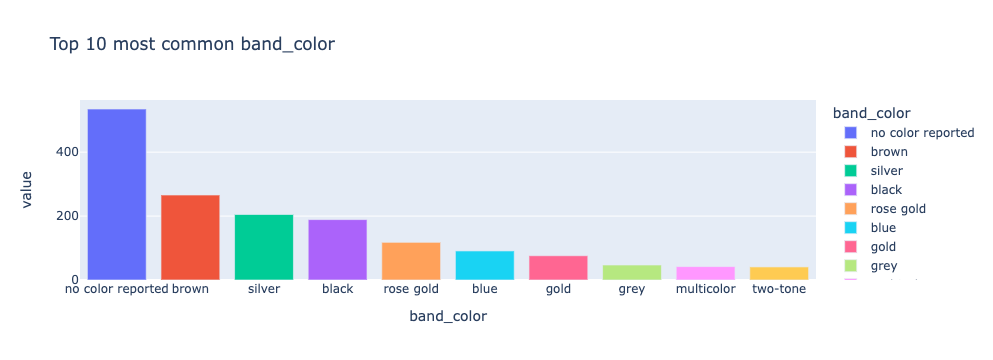

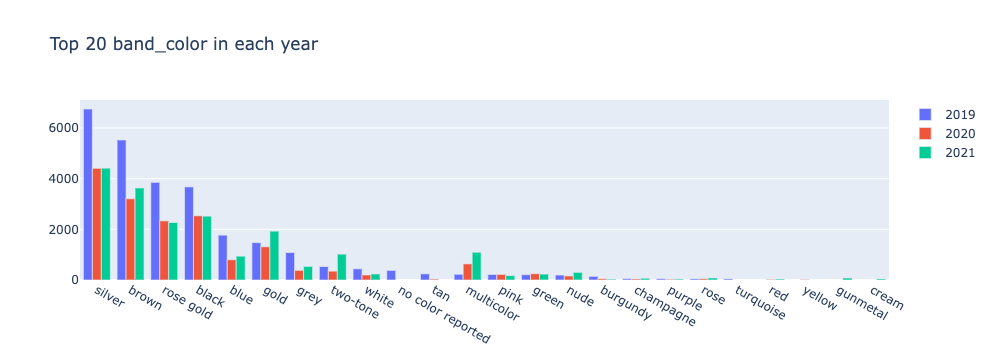

In [23]:
eda_by_column(df_models,'band_color')

Color generally seems to be a good variable to keep. Gold and silver is a strong driver of sales across all parts 

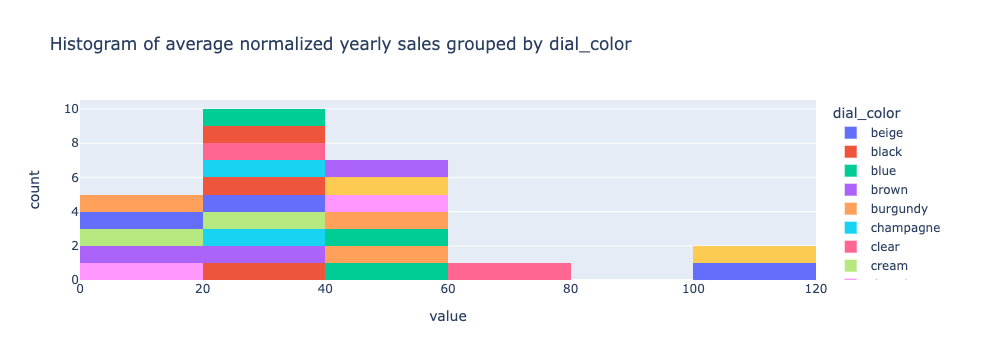

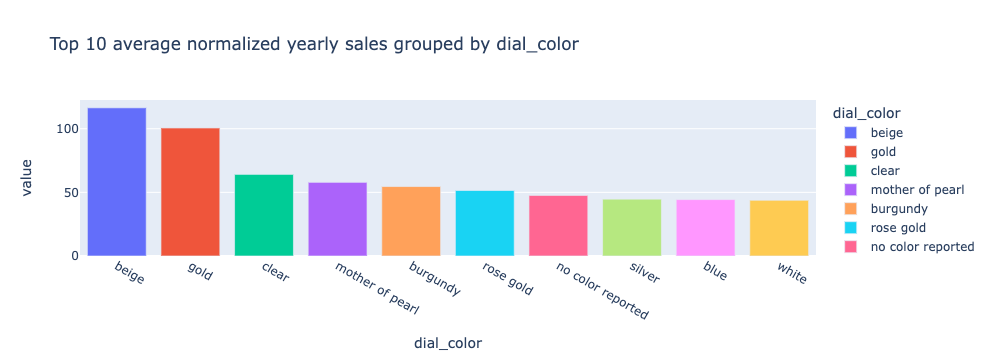

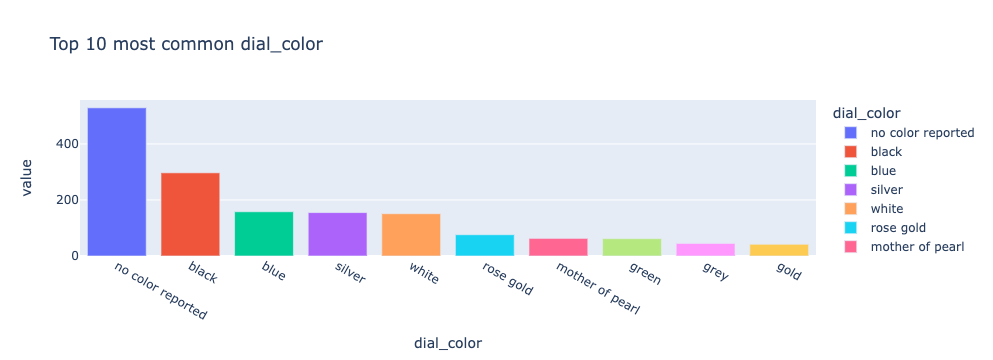

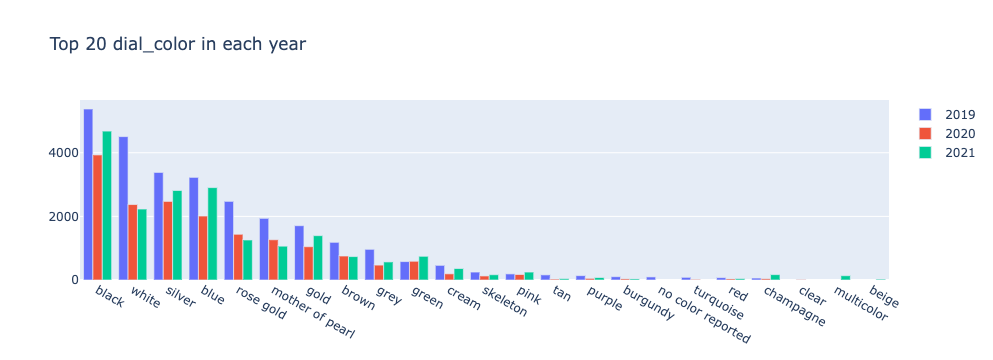

In [24]:
eda_by_column(df_models,'dial_color')

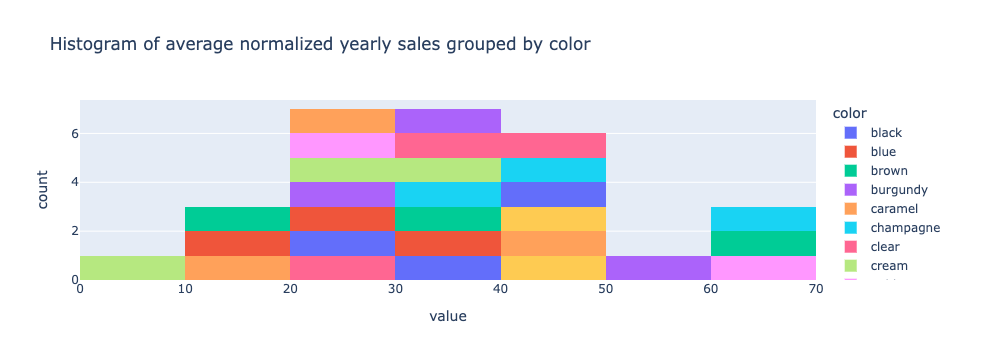

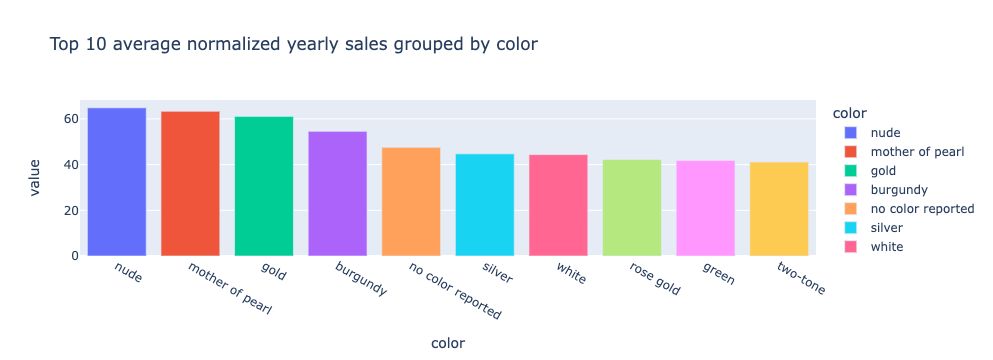

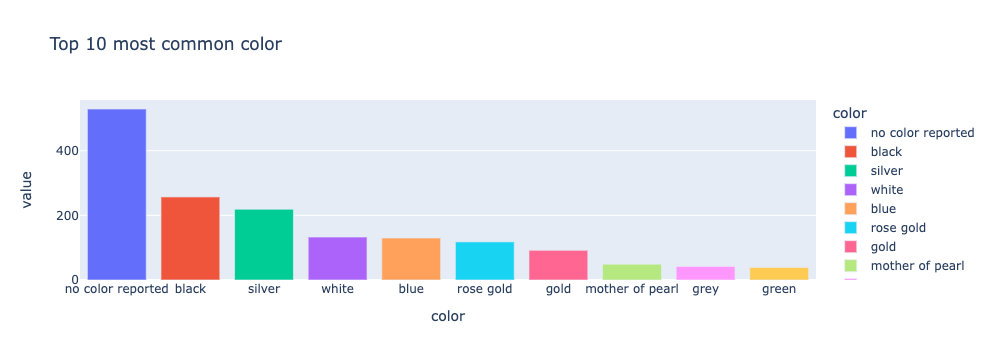

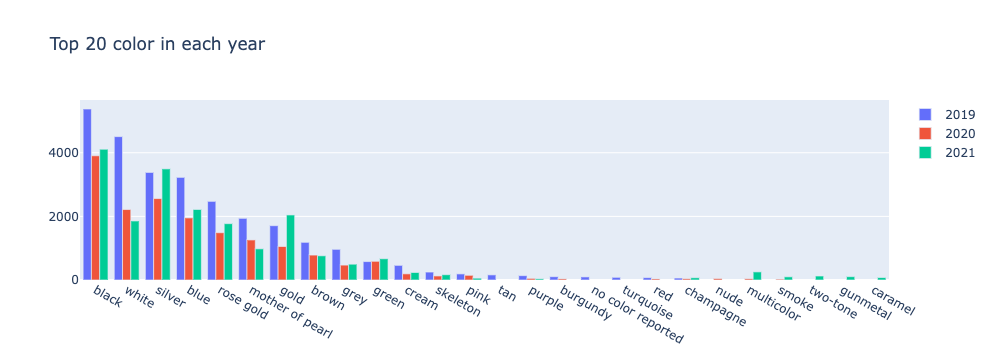

In [25]:
eda_by_column(df_models, 'color')

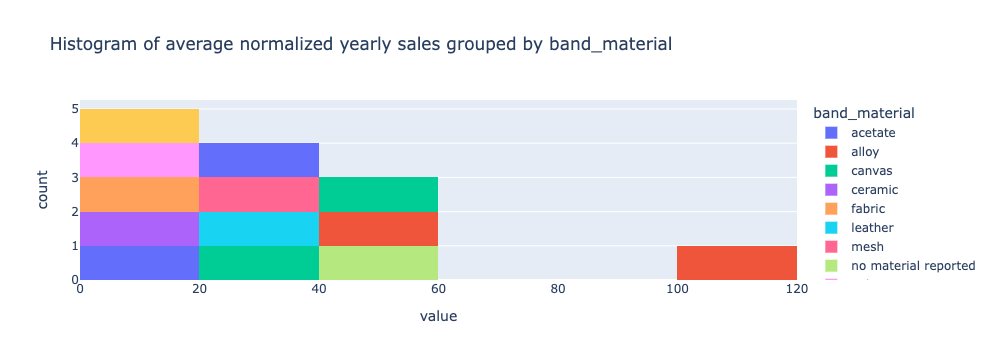

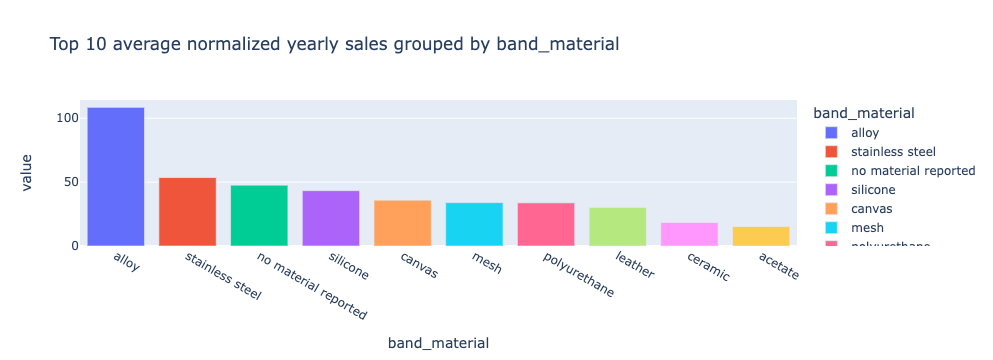

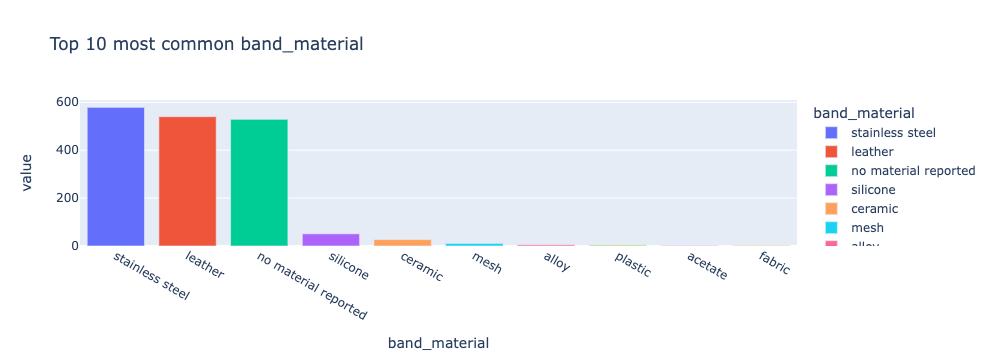

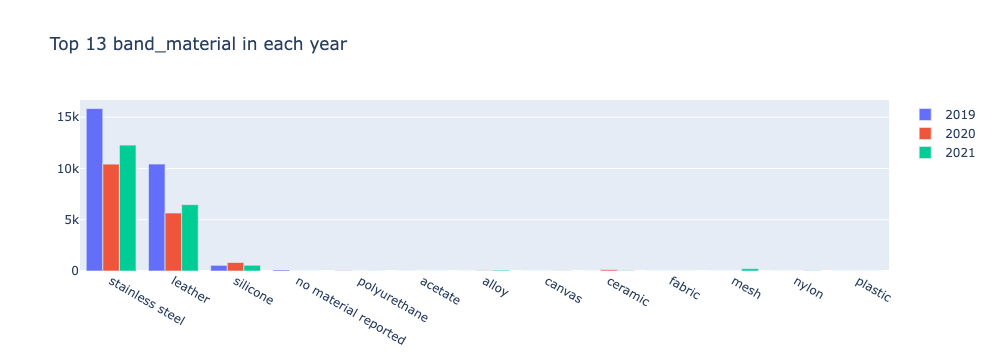

In [26]:
eda_by_column(df_models, 'band_material')

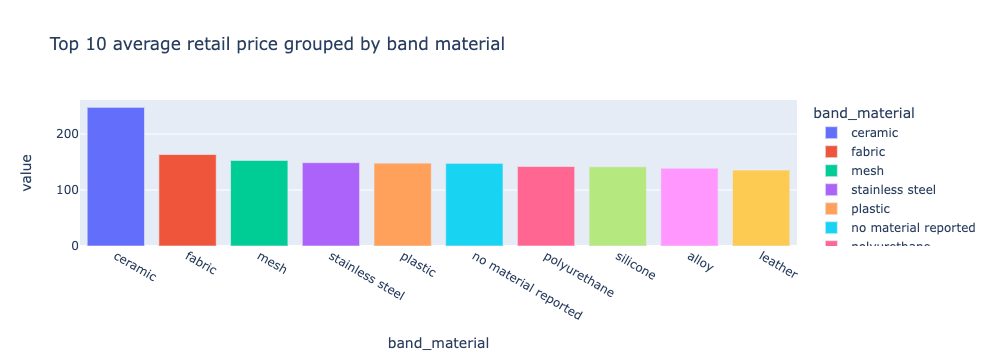

In [27]:
data1 = df_models.groupby(by='band_material').mean()['retail_price'].sort_values(ascending=False).head(10)
px.bar(data1, title = f'Top 10 average retail price grouped by band material', color = data1.keys())

Band material has an interesting outlier with alloy, otherwise stainless steel is better than average and much better than leather. There are some materials with much lower sales. This does not appear to be totally related to retail price.

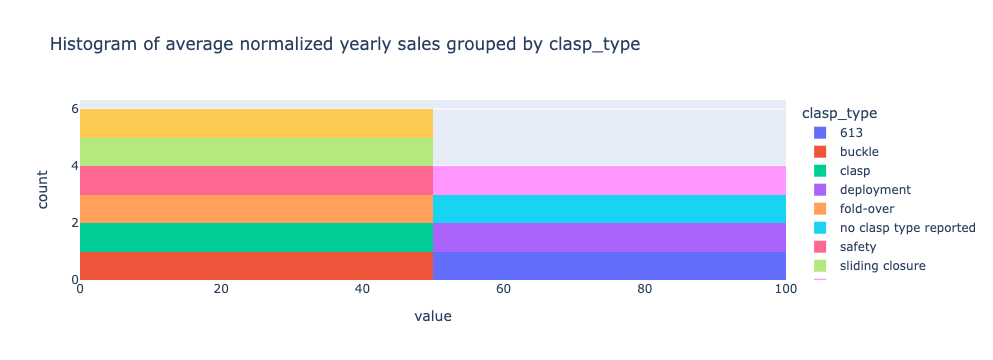

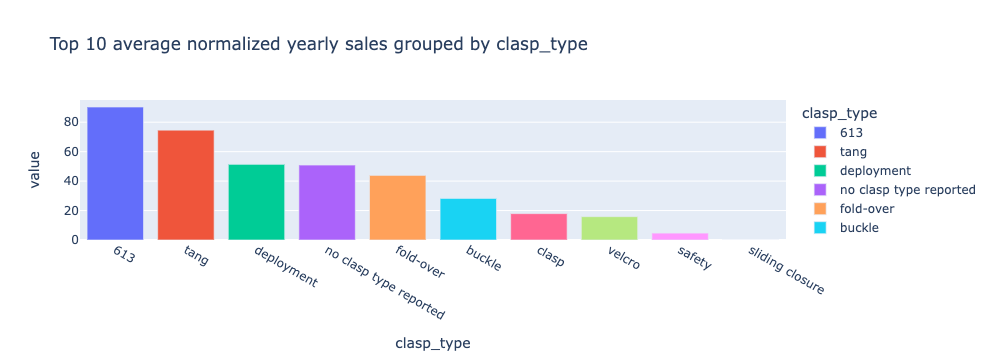

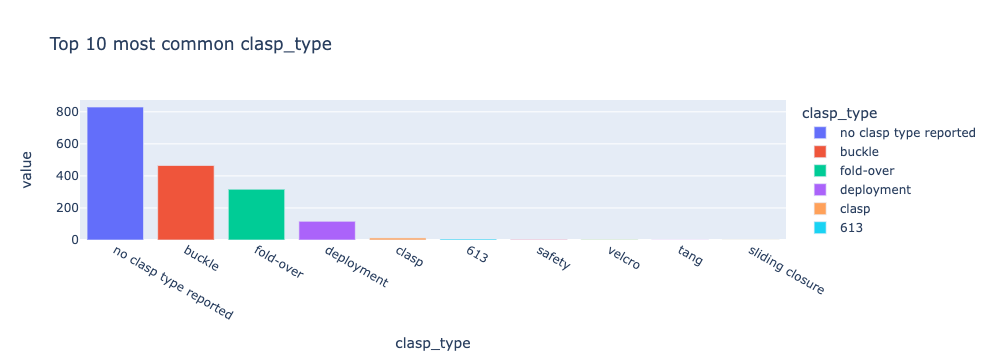

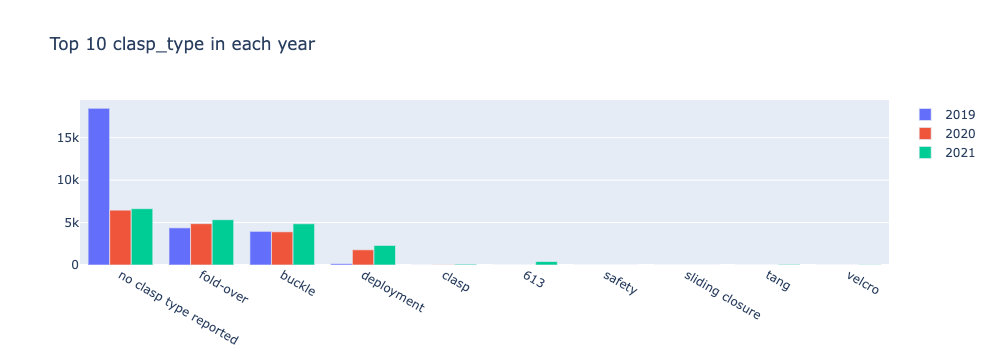

In [34]:
eda_by_column(df_models, 'clasp_type')

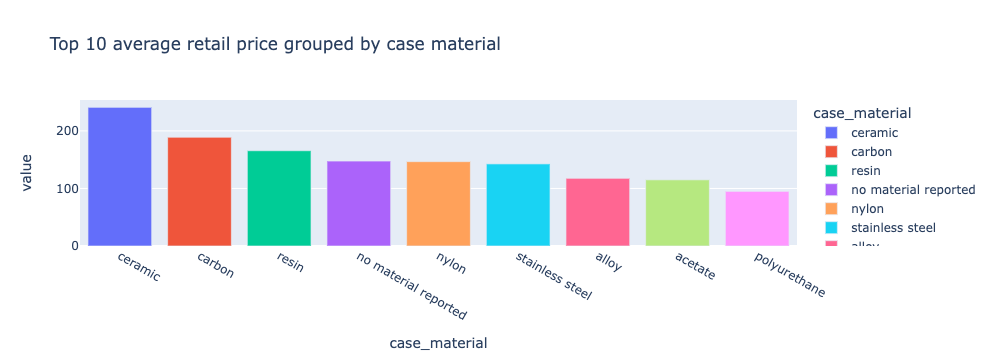

In [29]:
data1 = df_models.groupby(by='case_material').mean()['retail_price'].sort_values(ascending=False).head(10)
px.bar(data1, title = f'Top 10 average retail price grouped by case material', color = data1.keys())

Same observations apply to case material, however there does appear to be some correlation with retail price. Stainless steel seems to outperform all other materials except for alloy. However, all new models are stainless steel, so this won't impact our results currently.

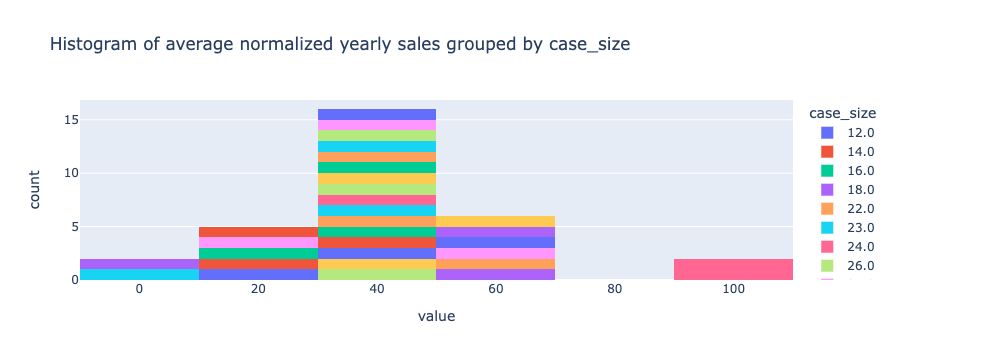

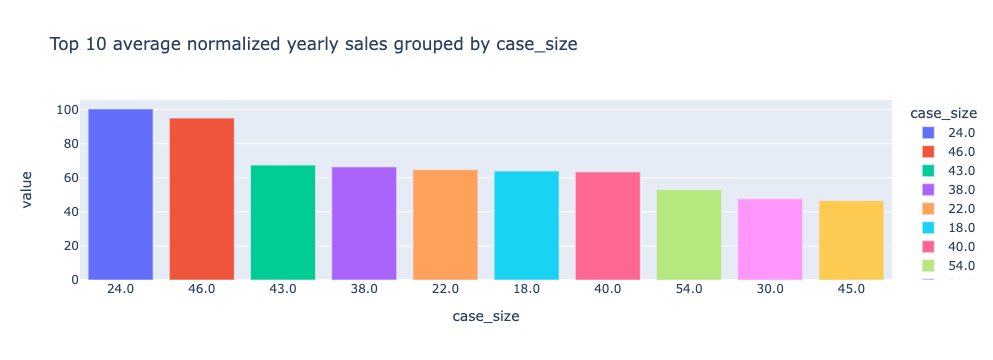

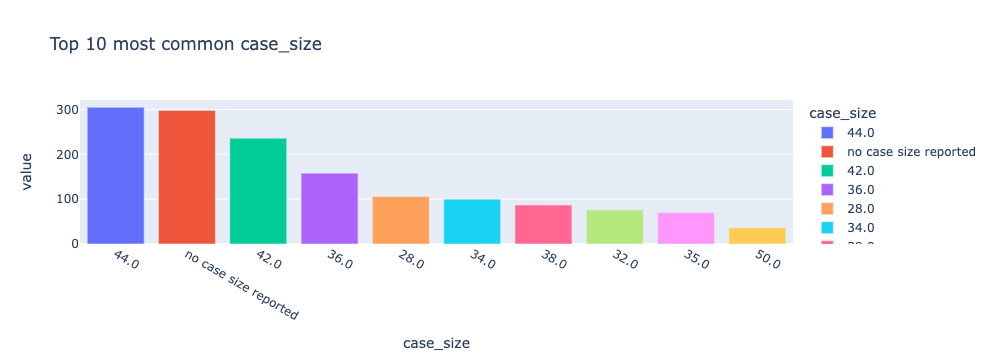

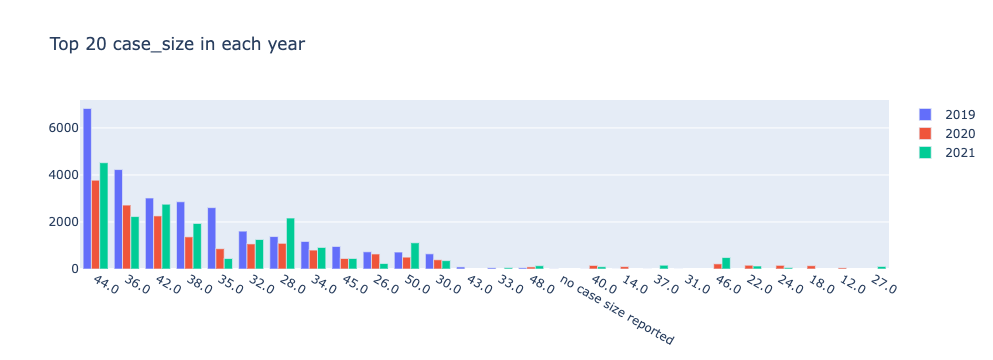

In [30]:
eda_by_column(df_models, 'case_size')

Case size seems to be a good indicator, as averages are spread across the distribution.

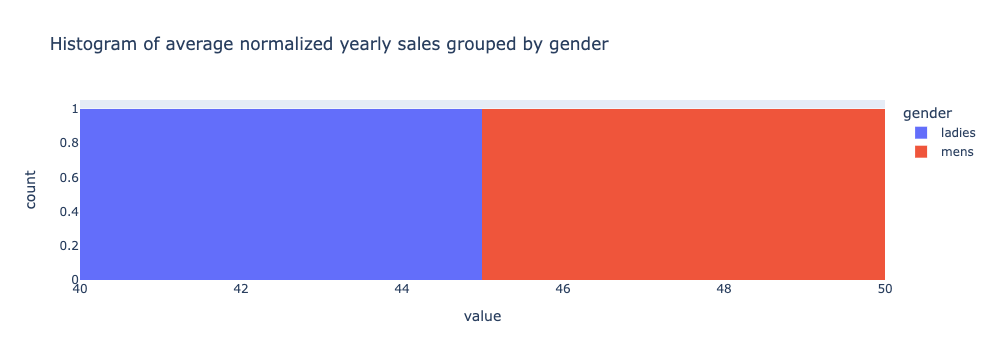

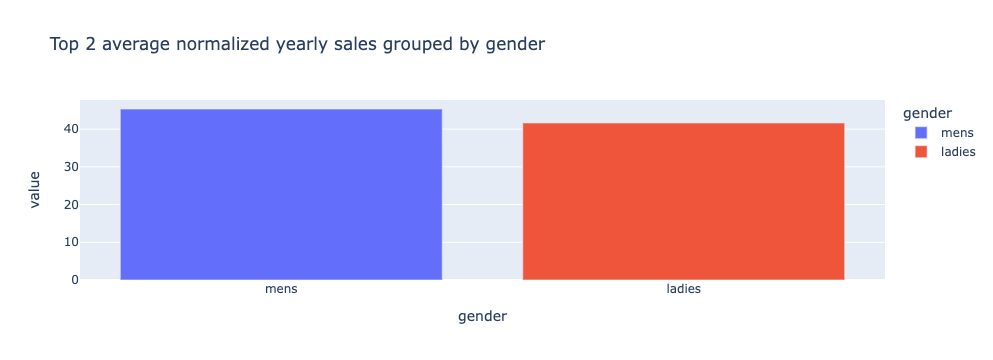

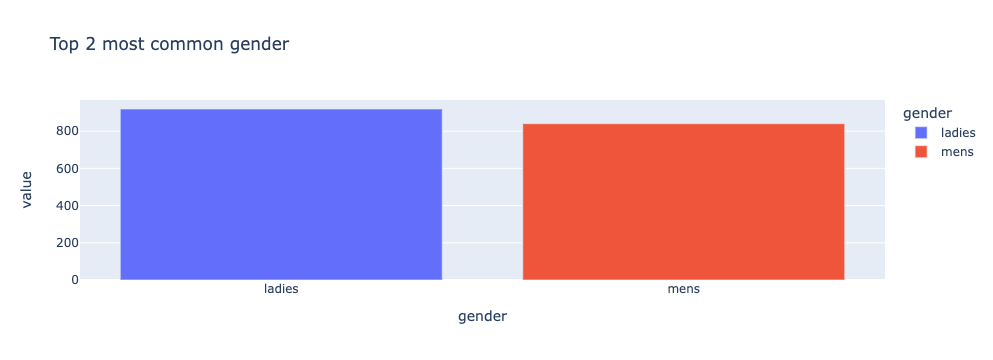

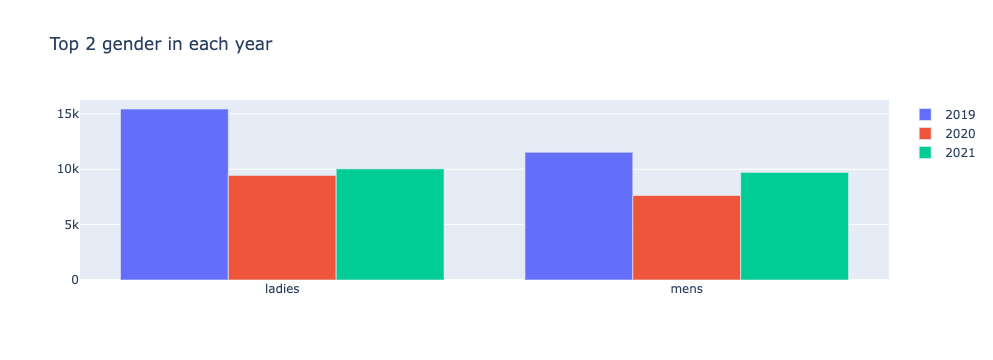

In [31]:
eda_by_column(df_models, 'gender')

Gender does not appear to have a large impact on sales, but dropping it has an impact on the model performance

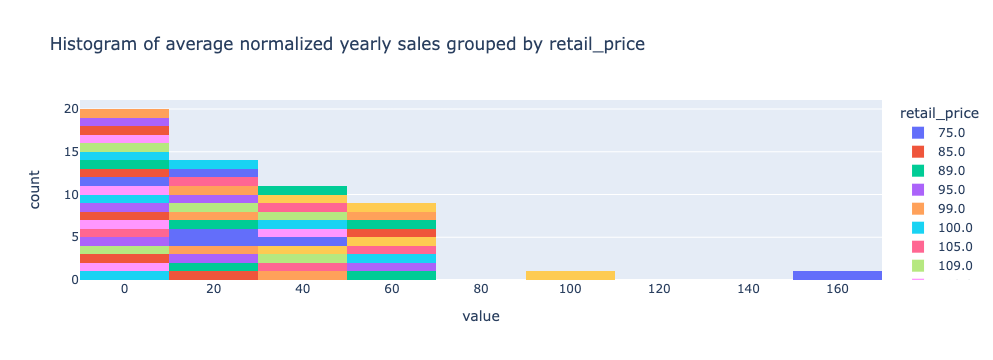

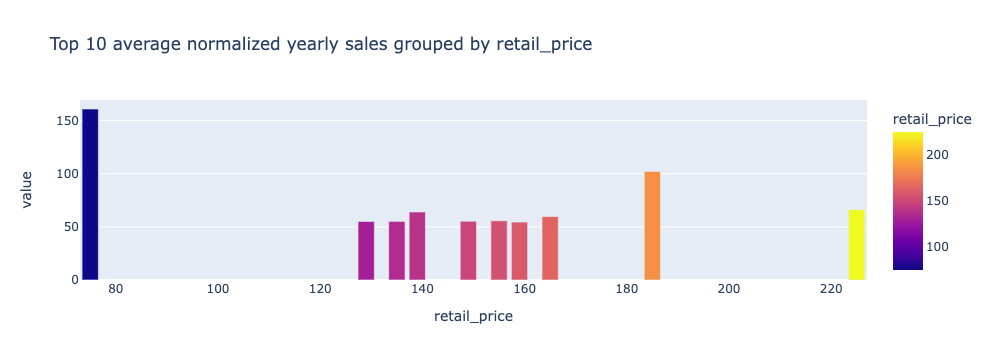

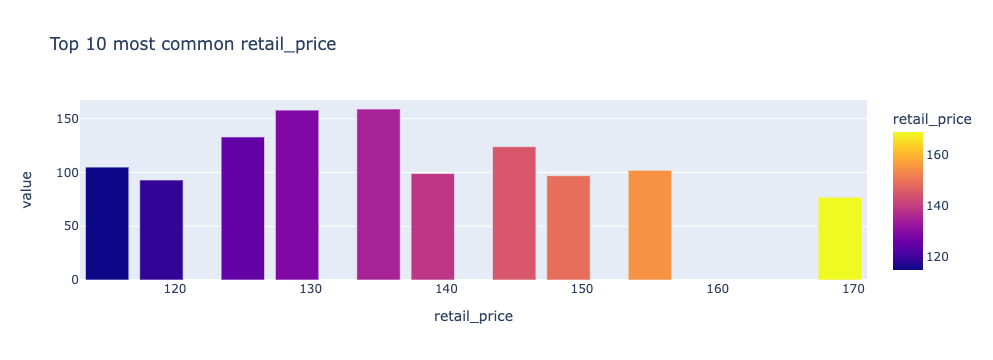

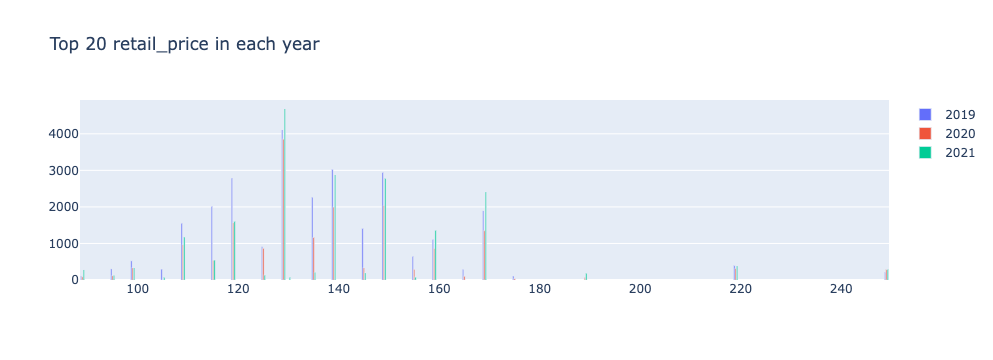

In [32]:
eda_by_column(df_models, 'retail_price')

Retail price have a strong impact on sales, where prices in the 125-175 are more likely to be the top hits. It's hard to tell the overall trend outside this range, so I will explore this further in the model.

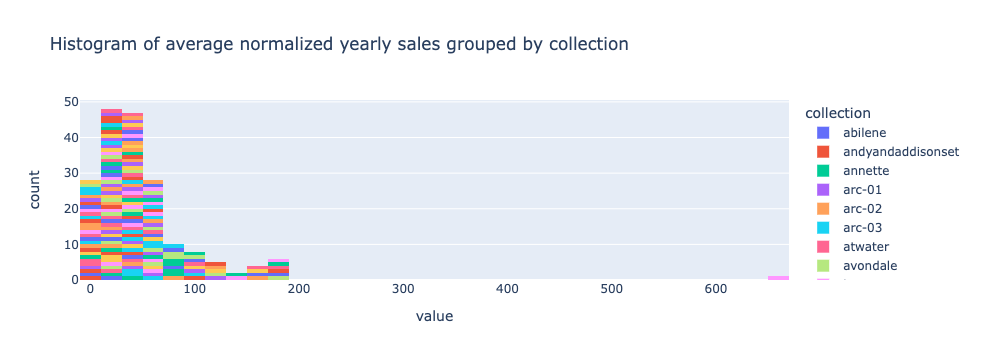

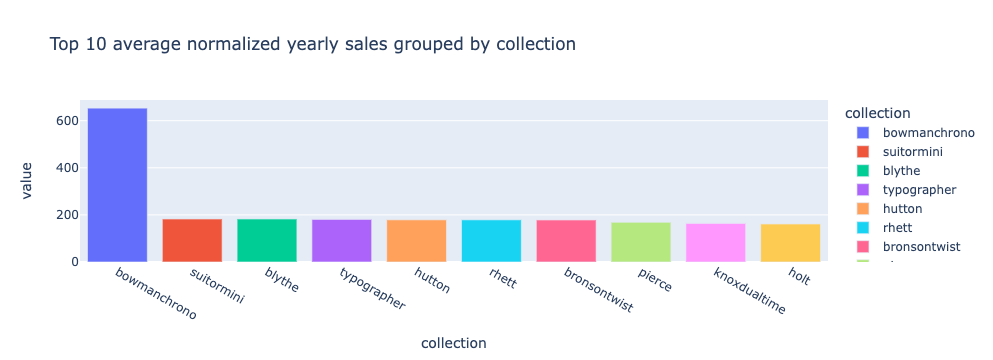

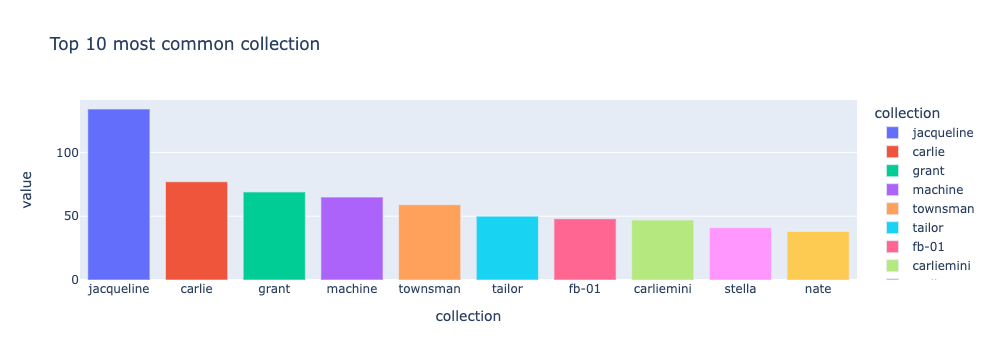

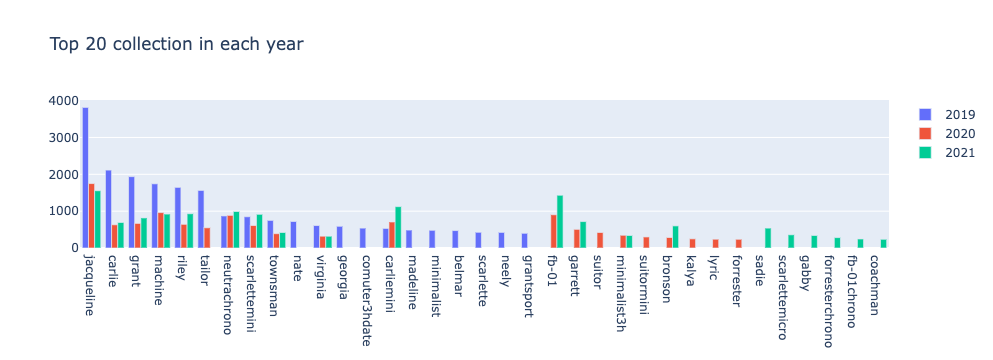

In [33]:
eda_by_column(df_models, 'collection')

Collection is another good variable to use because there is spread. There is one collection that is an outlier (bowmanchrono).

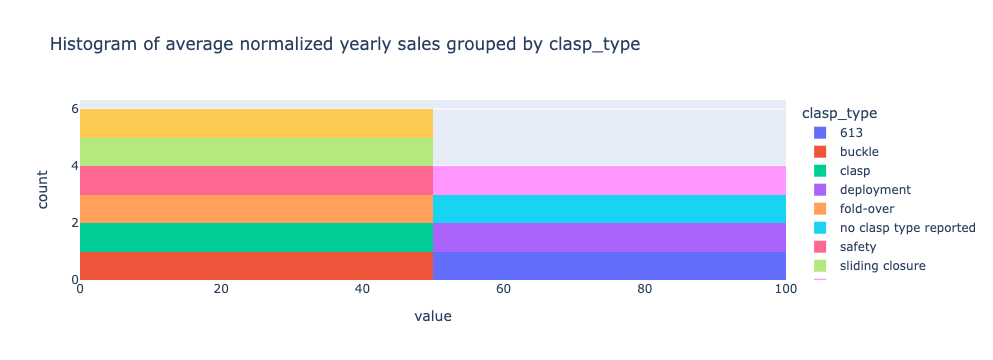

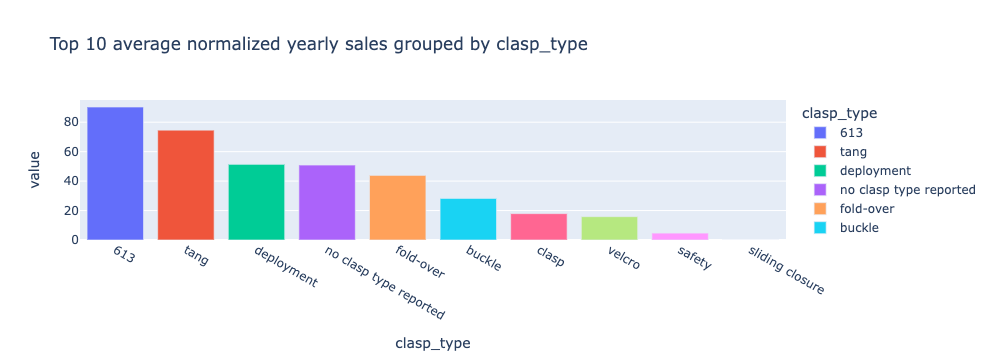

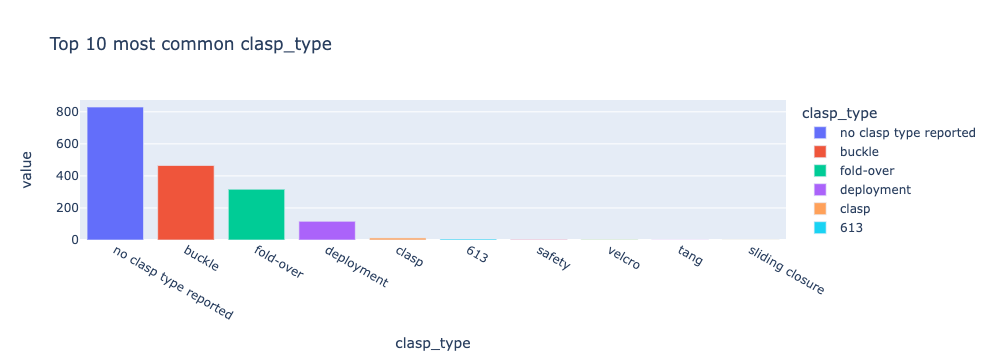

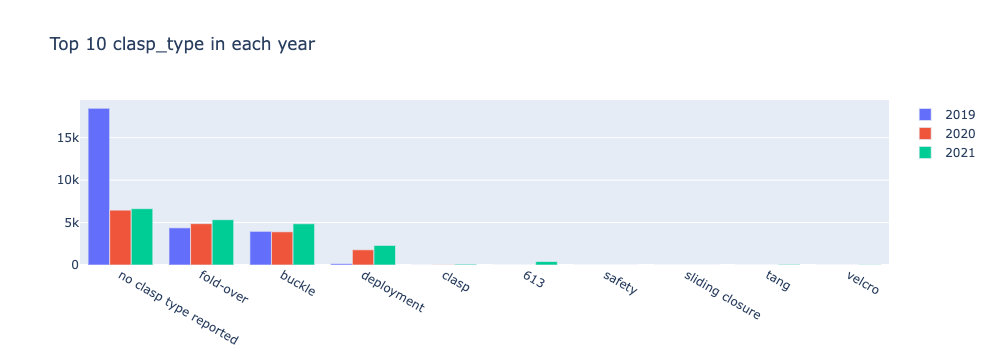

In [34]:
eda_by_column(df_models, 'clasp_type')

Clasp type is a good indicator as well - deployment andfold-over types tend to do better than buckle, and they are all common types.

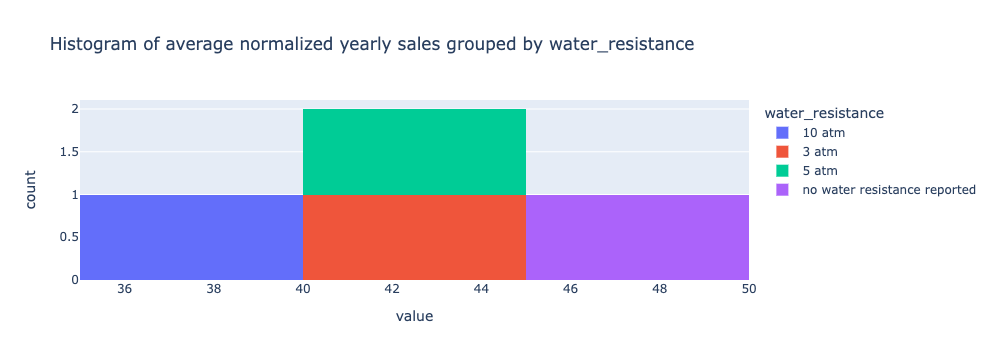

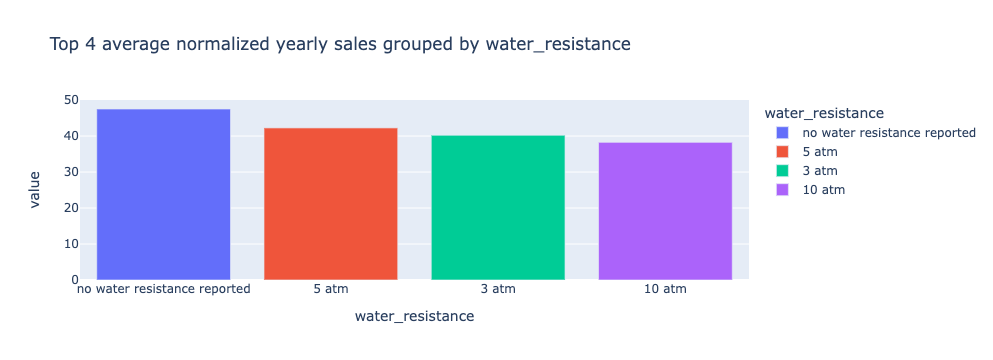

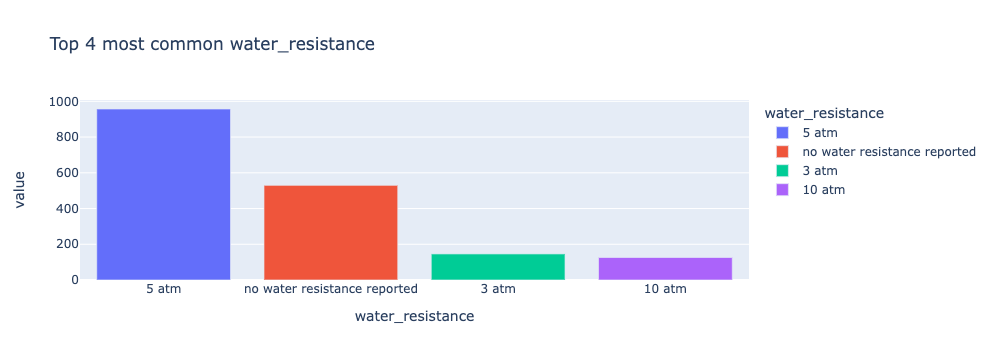

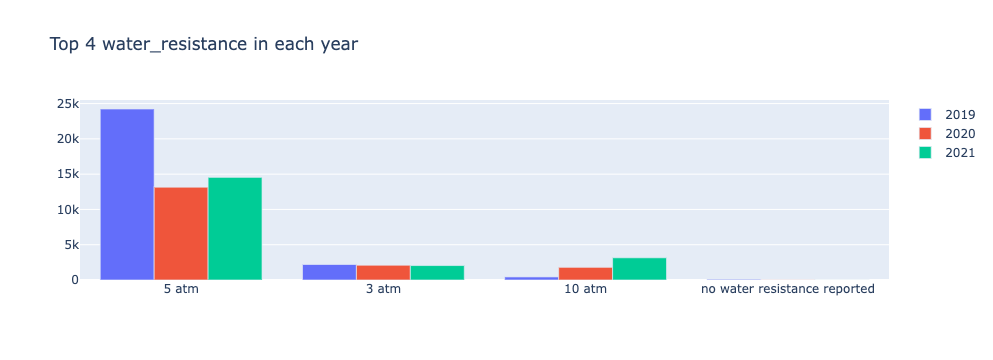

In [35]:
eda_by_column(df_models, 'water_resistance')

Water resistance does not appear to be a strong indicator of sales, but might influence the results slightly.

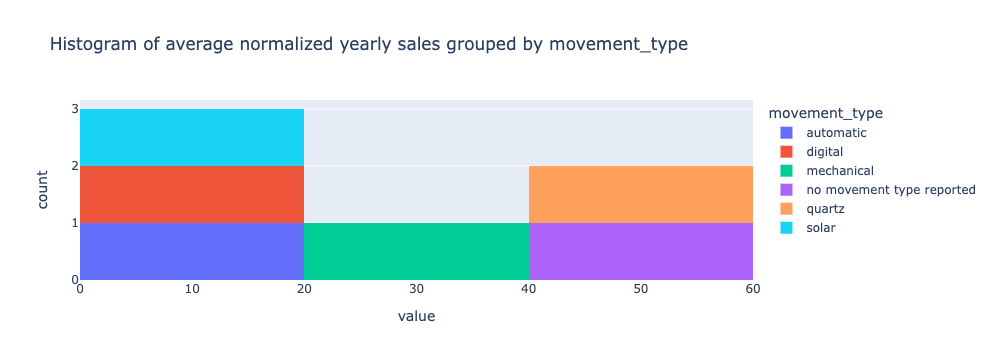

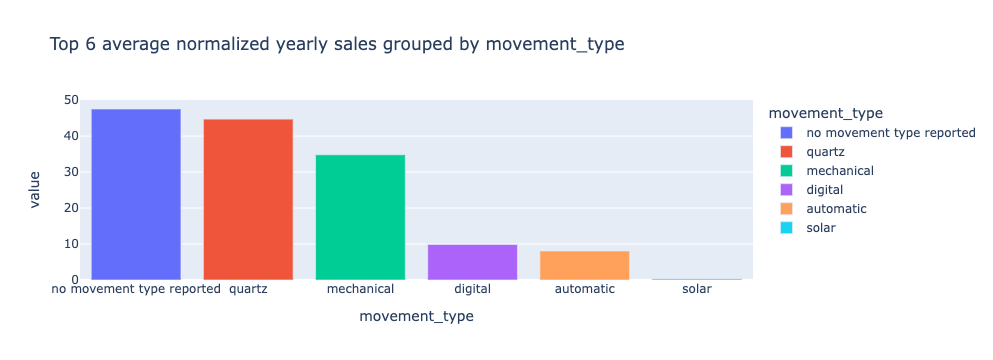

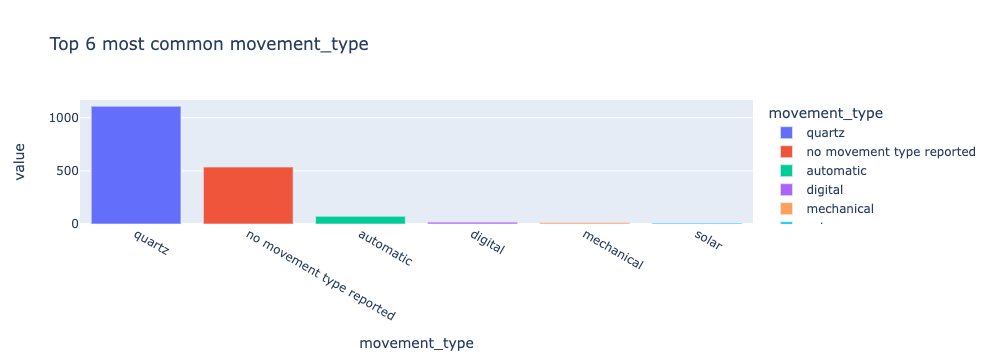

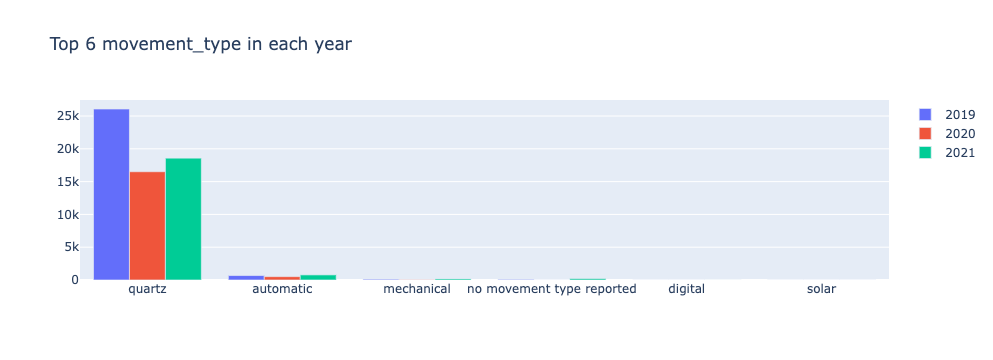

In [36]:
eda_by_column(df_models, 'movement_type')

Movement type seems to have some effect, where the average is quartz, and mechanical does slightly worse (and the rest do much worse).

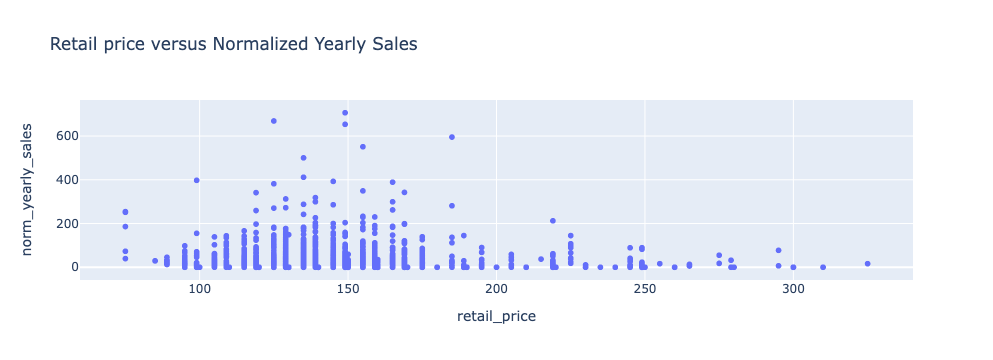

In [37]:
px.scatter(data_frame=df_models, x='retail_price',y='norm_yearly_sales',title='Retail price versus Normalized Yearly Sales')

In [38]:
df_models[['retail_price','norm_yearly_sales']].corr()

,retail_price,norm_yearly_sales
retail_price,1.000000,-0.091304
norm_yearly_sales,-0.091304,1.000000


There is no strong linear correlation between retail price and normalized yearly sales.